<center>
    <h1>ADRL Assignment 1</h1>
    <h2>Generative Adversarial Networks</h2>
    <h3>Team Members</h3>
    <ul>
        <li>Gouri Shanker</li>
        <li>Abhay Patidar</li>
        <li>Shreeman Agrawal</li>
    </ul>
</center>

## Question 1 and 7 : Training DC GAN with Wasserstein metric

### imports

In [ ]:
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, ConcatDataset, Dataset, random_split, Subset
from torchvision import  datasets, transforms, models
import torchvision.utils as vutils

import cv2, numpy as np, pandas as pd
import random
import matplotlib.pyplot as plt
import os

In [ ]:
# Class for Runtime Augmentation of Images

class AdaptiveAugmentation:
    def __init__(self, initial_prob=0.5, max_prob=0.8, adapt_rate=0.001):
        self.prob = initial_prob
        self.max_prob = max_prob
        self.adapt_rate = adapt_rate
        self.groups = 4
        
            
    @staticmethod         
    def inc_brightness( images):
        amount = random.uniform(0.1, 0.3)
        t1 = images + amount
        t1 = t1.clip(-1, 1)
        return t1
    
    @staticmethod
    def dec_brightness( images):
        amount = random.uniform(0.1, 0.3)
        t1 = images - amount
        t1 = t1.clip(-1, 1)
        return t1
    
    @staticmethod
    def adjust_saturation(image_tensor,  dim = 1):
        saturation_factor = random.uniform(1.2, 3)
        image_tensor = (image_tensor + 1) / 2
        grayscale = image_tensor.mean(dim=dim, keepdim=True)
        adjusted_image = grayscale + saturation_factor * (image_tensor - grayscale)
        adjusted_image = adjusted_image.clamp(0, 1)
        return (adjusted_image * 2) - 1
    
    @staticmethod
    def adjust_sharpness(batch_tensor):
        sharpness_factor = random.uniform(1, 1.2)
        kernel = torch.tensor([[0, -1, 0],
                            [-1, 5, -1],
                            [0, -1, 0]], dtype=torch.float32).to(device = batch_tensor.device) * sharpness_factor
        kernel = kernel.unsqueeze(0).unsqueeze(0)  
        kernel = kernel.repeat(3, 1, 1, 1) 
        sharpened_batch = F.conv2d(batch_tensor, kernel, padding=1, groups=3)
        return sharpened_batch.clamp(-1, 1)
    
    def augmentations(self , images):
         variations = [self.inc_brightness ,self.dec_brightness , transforms.RandomRotation(degrees = (-5 ,5)) , transforms.RandomAffine(degrees=0, shear=(-5, 5)),   transforms.RandomPerspective(distortion_scale=0.1, p=1), self.adjust_saturation , self.adjust_sharpness   ]
         index = random.randint(0, len(variations)-1)
         return variations[index](images)
         
         
    def adapt_probability(self, critic_loss_real, critic_loss_fake):

        if critic_loss_real - critic_loss_fake > 0:
            self.prob = min(self.max_prob, self.prob + self.adapt_rate)
        else:
            self.prob = max(0, self.prob - self.adapt_rate)

    def apply(self, images):
        if random.random() < self.prob:
            internal_batch_size = images.shape[0]//self.groups
            images = torch.concat([self.augmentations(images[i:i+internal_batch_size]) for i in range(0 , len(images) , internal_batch_size)])

        return images

<h3>Model</h3>
<p>The model consists of two main components:</p>
<ul>
    <li><b>Generator</b></li>
    <li><b>Critic</b></li>
</ul>

In [ ]:
class DeconvBlock(nn.Module):
    def __init__(self, n_in, n_out, ks, stride = 2, pad = 1, bn=True):
        super().__init__()
        self.conv = nn.ConvTranspose2d(n_in, n_out, ks, stride, padding=pad, bias=False)
        self.relu = nn.ReLU(inplace=True)
        self.bn = nn.BatchNorm2d(n_out)

    def forward(self, x):
        x = self.relu(self.conv(x))
        return self.bn(x)

class ConvBlock(nn.Module):
    def __init__(self, n_in, n_out, ks, stride = 2, pad = 1, bn=True):
        super().__init__()
        self.conv = nn.Conv2d(n_in, n_out, kernel_size=ks, bias=False, stride=stride, padding=pad)
        self.relu = nn.LeakyReLU(negative_slope=0.2, inplace=True)
        self.bn = nn.BatchNorm2d(n_out)

    def forward(self, x):
        x = self.relu(self.conv(x))
        return self.bn(x)



class Critic(nn.Module):
    def __init__(self, kernel_size = 4, scaling = 64, number_channels = 3, output_dims = 1):
        super().__init__()
        self.model = nn.Sequential(
            ConvBlock(number_channels, scaling, kernel_size, bn=False),
            ConvBlock(scaling, scaling*2, kernel_size),
            ConvBlock(scaling*2, scaling*4, kernel_size),
            ConvBlock(scaling*4, scaling*8, kernel_size),
            ConvBlock(scaling*8, scaling*16, kernel_size),
            nn.Conv2d(scaling*16, output_dims, kernel_size, stride = 1, padding = 0, bias=False)
        )

    def forward(self, input):
        return self.model(input).squeeze()
    

class Generator(nn.Module):
    def __init__(self, kernel_size = 4, latent_size = 100, scaling = 64, number_channels = 3):
        super().__init__()
        self.model = nn.Sequential(
            DeconvBlock(latent_size, scaling*16, kernel_size, stride = 1, pad = 0),
            DeconvBlock(scaling*16, scaling*8, kernel_size),
            DeconvBlock(scaling*8, scaling*4, kernel_size),
            DeconvBlock(scaling*4, scaling*2, kernel_size),
            DeconvBlock(scaling*2, scaling, kernel_size),
            nn.ConvTranspose2d(scaling, number_channels, kernel_size, bias=False),
            nn.Tanh()
        )
    def forward(self, input):
        return self.model(input)
    
    
class DCGan(nn.Module):
    def __init__(self, latent_size = 100, output_dims = 1):
        super(DCGan,self).__init__()
        self.gen = Generator(latent_size = latent_size)
        self.critic = Critic(output_dims = output_dims)


In [3]:
class DCTrainer():
    def __init__(self,model , dataloader , augmentor, optim_gen , optim_critic  , epochs, device ,latent_dims, lambda_ = 5 , path ='multi'):
        self.model = model.to(device)
        self.dataloader = dataloader
        self.augmentor = augmentor
        self.optim_gen = optim_gen 
        self.optim_critc = optim_critic
        self.epochs = epochs
        self.device = device
        self.lambda_ = lambda_
        self.latent_dims = latent_dims
        self.path = path
        self.mvn = torch.distributions.MultivariateNormal( torch.zeros(latent_dims)  , torch.eye(latent_dims) )
    
    
    def latent_sampler(self ,batch_size ):
        samples = self.mvn.sample((batch_size,))
        return samples

    # not using it now
    def noramlize_weights(self ):
        for p in self.model.critic.parameters():
            p.data.clamp_(-0.01 ,0.01)

    # using gradient penalty for wgan gp
    def gradient_penalty(self , real , fake):
        alpha = torch.rand(real.shape[0], 1, 1, 1).to(self.device)
        interpolates = (alpha * real + (1 - alpha) * fake).requires_grad_(True)
        disc_interpolates = self.model.critic(interpolates)
        gradients = torch.autograd.grad(outputs=disc_interpolates, inputs=interpolates,
                                        grad_outputs=torch.ones(disc_interpolates.size()).to(self.device),
                                        create_graph=True, retain_graph=True, only_inputs=True)[0]
        gradients = gradients.view(gradients.size(0), -1)
        gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
        return gradient_penalty

    def set_gradient_info(self, model , flag):
        model.trainable = flag
        for p in model.parameters():
            p.requires_grad = flag
    
    def train_step(self , epoch ) :
        for i , (data_batch , _) in enumerate(self.dataloader):

            data = self.augmentor.apply(data_batch).to(self.device)
            self.set_gradient_info(self.model.critic, True)
            self.set_gradient_info(self.model.gen , False)
            self.optim_critc.zero_grad()
            z = self.latent_sampler(data.shape[0]).to(device=self.device)
            gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1)).detach()
            gen_data = self.augmentor.apply(gen_data)
            gen_y   = self.model.critic(gen_data) 
            real_y = self.model.critic(data)
            loss_critic = gen_y.mean() - real_y.mean() + self.lambda_ * self.gradient_penalty(data , gen_data)
            loss_critic.backward()
            self.optim_critc.step()
            self.augmentor.adapt_probability(real_y.mean().item(), gen_y.mean().item())

            # used 3 for augmentation and 5 for augmentation_fresh
            if i%5 == 0:
                self.set_gradient_info(self.model.critic, False)
                self.set_gradient_info(self.model.gen , True)
                self.optim_gen.zero_grad()
                z = self.latent_sampler(data.shape[0]).to(device=self.device)
                gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1))
                gen_data = self.augmentor.apply(gen_data)
                loss_gen = - torch.mean(self.model.critic(gen_data)) # W-GAN loss
                loss_gen.backward()
                self.optim_gen.step()
                print(f"Epoch [{epoch}], Critic Loss: {loss_critic.item():.4f}, Generator Loss: {loss_gen.item():.4f}, Augmentation Probability: {augmentor.prob:.4f}")
                    

    def show(self, nx=10, images=None):

        if images is None:
            images = self.generate_images(nx) 

        images = [images[i].permute(1, 2, 0).detach().cpu().numpy() for i in range(images.shape[0])]
        
        rows = nx // 5 + (nx % 5 > 0)
        fig = plt.figure(figsize=(15, 3 * rows)) 

        for i, image in enumerate(images):
            ax = fig.add_subplot(rows, 5, i + 1)  # Create subplot
            ax.imshow((image * 0.5 +0.5))  # Scale images to 0-255 range
            ax.axis('off')  # Hide the axis for clean display

        plt.tight_layout()  # Prevent overlap and adjust layout
        return fig 

    def generate_images(self , number = 5):
        self.model.eval()
        with torch.no_grad():
            z = self.latent_sampler(number).to(device=self.device)
            images = self.model.gen(z)
            return images
        
    def train(self , starting = 0):
        for epoch in range(starting , self.epochs):
            self.train_step(epoch)
            if(epoch%5 == 0 ):
               self.checkpoint(epoch)

    def checkpoint(self , epoch):
        if(not os.path.exists(self.path)):
            os.makedirs(self.path)
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_critic_state_dict': self.optim_critc.state_dict(),
            'optimizer_gen_state_dict' : self.optim_gen.state_dict(),
            'epoch': epoch 
        }, f'{self.path}/checkpoint{epoch}.pth')

    def resume(self , path , iterations):
        checkpoint = torch.load(path , map_location=self.device)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optim_critc.load_state_dict(checkpoint['optimizer_critic_state_dict'])
        self.optim_gen.load_state_dict(checkpoint['optimizer_gen_state_dict'])
        epoch = checkpoint['epoch']
        self.epochs += iterations
        self.train(epoch)

In [ ]:
class DCTrainer_JS(DCTrainer):
    def __init__(self, model, dataloader, augmentor, optim_gen, optim_critic, epochs, device, latent_dims, lambda_ = 5 , path ='multi'):
        super(DCTrainer_JS).__init__(model, dataloader, augmentor, optim_gen , optim_critic, epochs, device, latent_dims, lambda_, path)

    def train_step(self, epoch) :
        for i , data in enumerate(self.dataloader):
            data = self.augmentor.apply(data).to(self.device)
            self.set_gradient_info(self.model.critic, True)
            self.set_gradient_info(self.model.gen , False)
            self.optim_critc.zero_grad()
            z = self.latent_sampler(data.shape[0]).to(device=self.device)
            gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1)).detach()
            gen_data = self.augmentor.apply(gen_data)
            gen_y   = self.model.critic(gen_data) 
            real_y = self.model.critic(data)
            loss_critic = gen_y.mean() - real_y.mean() + self.lambda_ * self.gradient_penalty(data , gen_data)
            loss_critic.backward()
            self.optim_critc.step()
            self.augmentor.adapt_probability(real_y.mean().item(), gen_y.mean().item())

            # used 3 for augmentation and 5 for augmentation_fresh
            if i%5 == 0:
                self.set_gradient_info(self.model.critic, False)
                self.set_gradient_info(self.model.gen , True)
                self.optim_gen.zero_grad()
                z = self.latent_sampler(data.shape[0]).to(device=self.device)
                gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1))
                gen_data = self.augmentor.apply(gen_data)
                loss_gen = - torch.mean(self.model.critic(gen_data)) # W-GAN loss
                loss_gen.backward()
                self.optim_gen.step()
                print(f"Epoch [{epoch}], Critic Loss: {loss_critic.item():.4f}, Generator Loss: {loss_gen.item():.4f}, Augmentation Probability: {augmentor.prob:.4f}")

## Hyperparameters

- **Batch Size:** 64
- **Input Dimensions:** 100
- **Epochs:** 3000
- **Image Size:** 128
- **Learning Rate Critic:** 0.00002
- **Learning Rate Generator:** 0.00005

In [ ]:
batch_size = 64
latent_size = 100
epochs = 3000
world_size = torch.cuda.device_count()
image_size  = 128

normalize = transforms.Compose([
    transforms.Resize((image_size  , image_size)),
    transforms.ToTensor(),
    transforms.Normalize((0.5 , 0.5 , 0.5) , (0.5 , 0.5 , 0.5))
])

dataset =  datasets.ImageFolder('dataset/animals', transform=normalize)
dataloader = DataLoader(dataset,batch_size=batch_size, shuffle=True, num_workers=4)
device = "cuda:0"
model = DCGan(latent_size).to(device)
optim_critc = torch.optim.RMSprop(model.critic.parameters() , lr=0.00002)
optim_gen = torch.optim.RMSprop(model.gen.parameters() , lr=0.00005)

augmentor = AdaptiveAugmentation()
trainer = DCTrainer(model , dataloader, augmentor=augmentor, optim_critic=optim_critc, optim_gen=optim_gen , epochs=epochs, device = device, latent_dims=latent_size, lambda_= 15, path = 'augmentation_lamda_15')
# trainer.resume("./augmentation/checkpoint2710.pth" , 2710)
# trainer.train()

## Loss curve for Generator and Discriminator losses

w-GAN

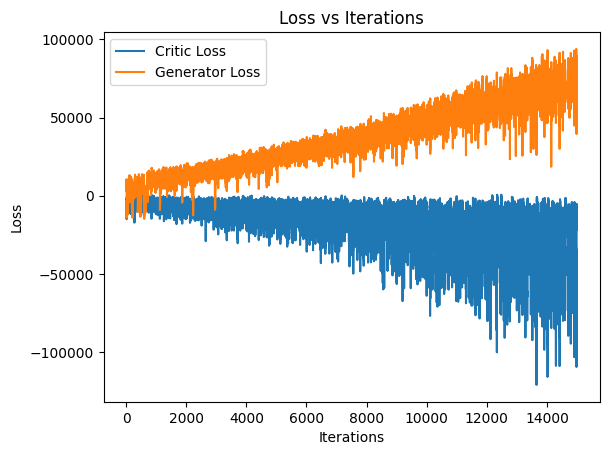

JS-loss

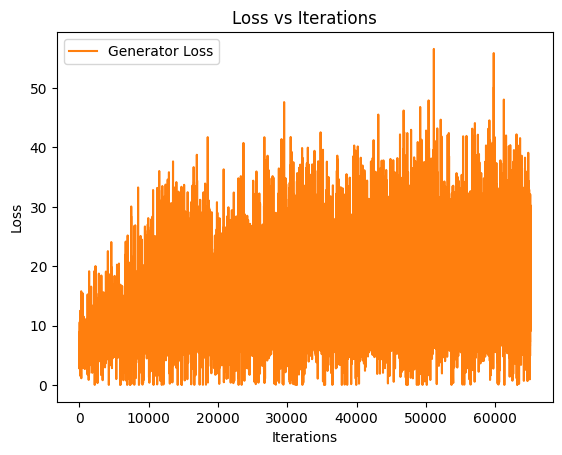
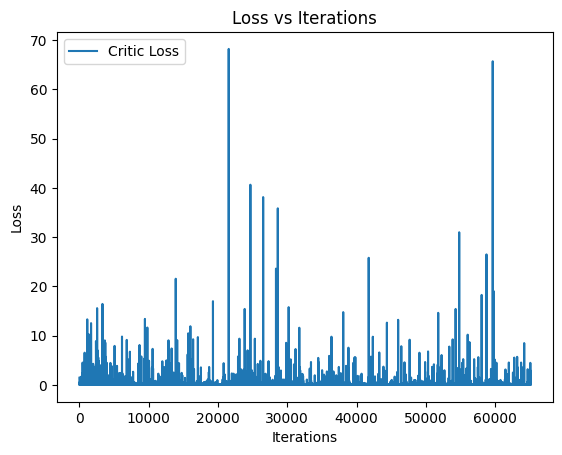

### Observations

#### Augmentation:

Without augmentation, the dataset does not have enough samples for any class or enough samples in general for the model to train, we observed that on the original dataset without augmentation the model was unable to learn anything, and was more prone to mode collapse.

The AdaptiveAugmentation class dynamically adjusts the probability of applying image augmentations based on the difference between real and fake critic losses. It includes a variety of augmentations such as adjusting brightness, saturation, sharpness, random rotations, affine transformations, and perspective distortions. The augmentation probability is adapted during training to help stabilize GAN performance, with images being grouped for augmentation to diversify the training data.

We tried both dynamic (runtime) augmentation, and static augmentation; in static augmentation we increased the dataset from 5400 images to 108000 images, static augmentation did not yield good results as the model started to learn the predict the augmented images itself instead of original images, dynamic augmentation yielded best results and that is what we have used for all further networks.

#### Loss Criterion:
<ul>
<li> Jenson-Shannon Divergence: Mode collapse occurs sometimes, but in general it gives worse results than w-GAN; FID Score: 247.9148712158203
<li> Wasserstein Distance: worked better than D-JS but still the results are not as good, which may be due to the small set of examples for each class; FID Score: 142.19557189941406
</ul>


#### Batch Size:

We found that due to the small amount of samples in each class, increasing the batch size beyond 64 resulted in the Generator not learning at all. This could be linked to internal covariance shift, which refers to the change in the distribution of layer activations during training. This shift can become more pronounced when dealing with small datasets and larger batch sizes, causing instability in GANs (such as DCGANs).

#### Optimizer:

We tried the following optmizers:
<ul>
<li> <b>Momentum and Adam :</b> did not work, as Gan optmizise a saddle point problem and we observed that momentum tends to overshoot this point.
<li> <b>SGD :</b> might work, it was working well but required more optmization, RMSprop preformed better.
<li> <b>RMSProp :</b> works the best out of the above optmizers, this is most probably due to RMSProp focusing on the magnitude of recent gradients, tends to handle smaller batch sizes better, also being less sensitive to noisy updates unlike momemtum.
</ul>

#### Learning Rate:

Through experimentation we found that learning rate should be order of 1e-5, which can be attributed again to the saddle point problem we are trying to solve and how it is sensitive to small changes


## Question 2 : Output of Gan training 

Using w-GAN

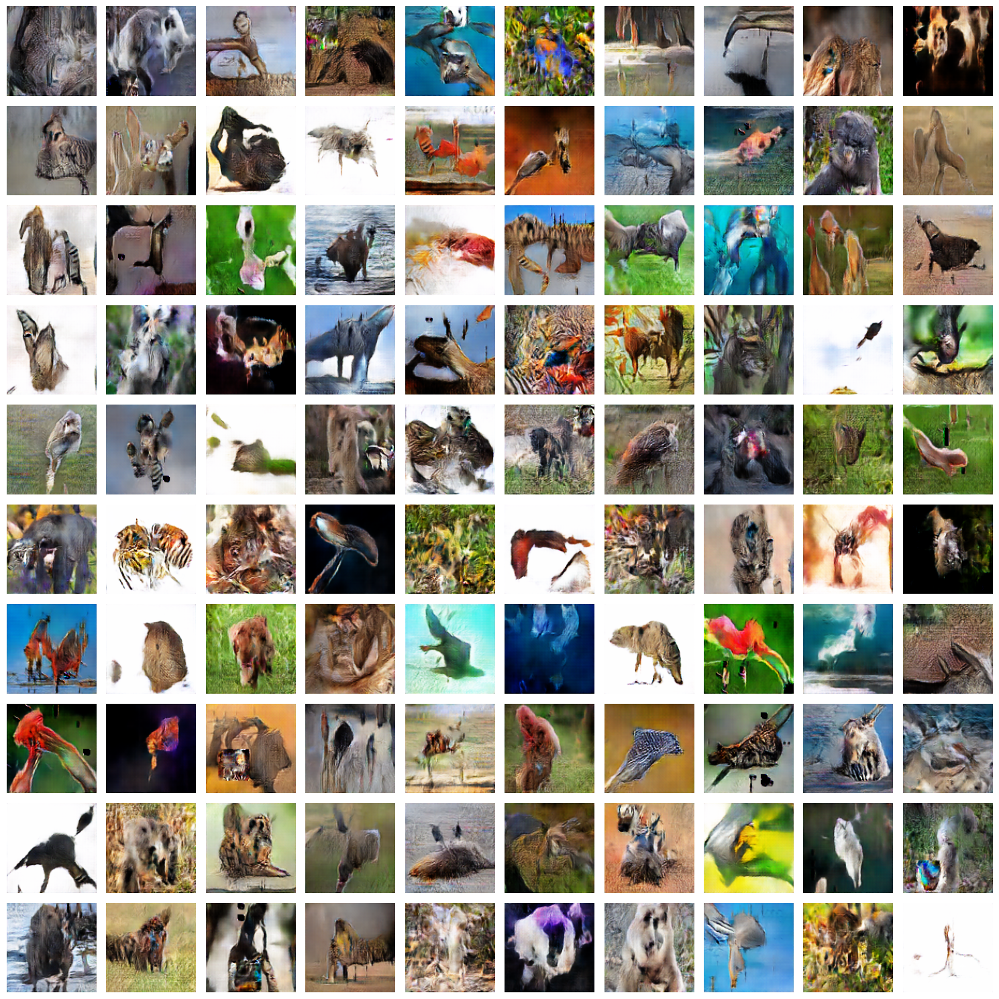

Using usual GAN loss

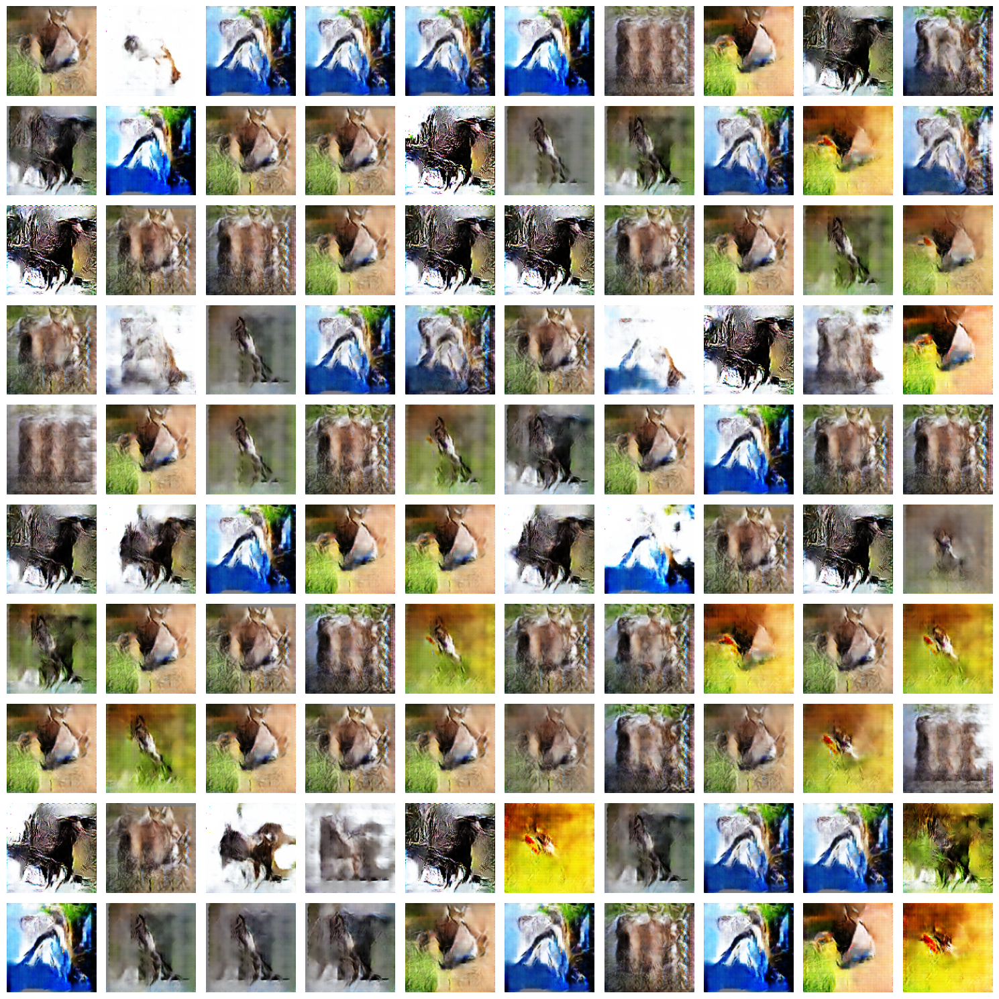

## Question 3 : Results on varying the number of times the generator and critic are trained

- The current best results we have are on training the critic 5 times and training the generator once
- When we increased the number of times the critic is trained to more than 5, we found that the critic soon overfitted the real data and its loss became 0, leading to generator not learning anything
- Training both the Generator and critic together gave okay results, but the generator took longer to train and in the earlier iterations was unable to learn anything due to the critic being too weak
- When we increased the number of times the generator is being trained while training the critic only once, it resulted in the generator learning to predict random noise.

## Question 4 : FID

In [ ]:
import torch
from torchmetrics.image.fid import FrechetInceptionDistance
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
import os

transform = transforms.Compose([
    transforms.Resize((128, 128)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  
])

real_image_folder = 'dataset/animals' 
real_dataset = ImageFolder(root=real_image_folder, transform=transform)
real_dataloader = DataLoader(real_dataset, batch_size=100, shuffle=True) 


# Calculating FID using 1000 images
def calculate_fid(dataloader , model):
    device = "cuda:3"
    def convert_to_unit8(image):
        image = (image * 127.5 + 127.5).clamp(0 , 255).to(torch.uint8).to(device)
        return image 
    fid = FrechetInceptionDistance(feature=2048).to(device)
    count = 0
    for x , y in dataloader:
        real_images = convert_to_unit8(x.to(device))
        fid.update(real_images, real=True)
        count +=1
        if(count == 10):
             break
    for _ in range(10):
          z = torch.randn(100,100).unsqueeze(-1).unsqueeze(-1)
          generated_images = model.gen(z.to(device))
          generated_images = convert_to_unit8(generated_images)
          fid.update(generated_images, real=False)
   
   
    fid_score = fid.compute().item()
    print(f"FID Score: {fid_score}")

Jenson-Shannon Divergence - FID Score: 247.9148712158203

Wasserstein Distance - FID Score: 142.19557189941406

## Question 5 : Latent space traversal

In [ ]:
import math
def linear_interpolation(z1 , z2 , t = 0.5):

    return t * z1 + (1-t) * z2

def non_linear_interpolation(z1  , z2 , t = 0.5):
    t2 = (1 - math.cos(t * math.pi)) / 2  
    return (1 - t2) * z1 + t2 * z2



z1 = torch.randn(5,100).unsqueeze(-1).unsqueeze(-1)
z2 =  torch.randn(5,100).unsqueeze(-1).unsqueeze(-1)

z_linear = linear_interpolation(z1 , z2)

z_non_linear = non_linear_interpolation(z1, z2)
for zz in [z1, z2, z_linear , z_non_linear]:
    y = model.gen(zz.to(device))
    trainer = DCTrainer(model , dataloader , augmentor= None, optim_critic=optim_critc, optim_gen=optim_gen , epochs=epochs , device = device , latent_dims=100  ,lambda_=10)
    fig = trainer.show10(zz.shape[0] , 0 , y)
    fig.show()

Results with t = 0.5

Sampled Z1

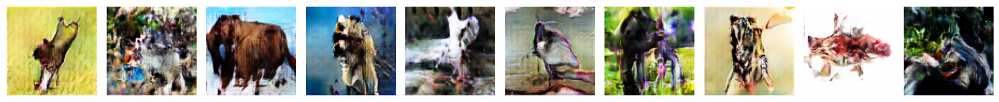

Sampled Z2

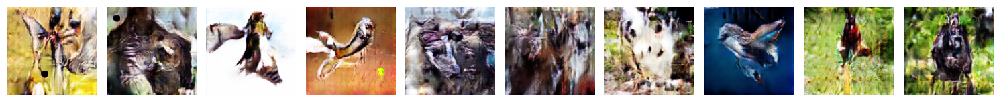

Linear Interpolation

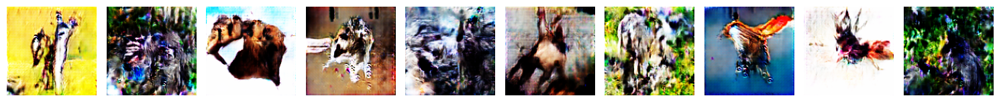

Non-Linear Interpolation (cosine)

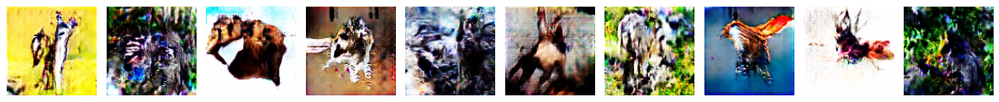

## Question 6 : c-GAN (20 subclasses)

In [ ]:
class c_Critic(nn.Module):
    def __init__(self, im_size, ks = 4, ndf = 64, nc=3, ngpu=1, classes = 20, img_dim = 128):
        super().__init__()
        self.ngpu = ngpu
        self.im_size = im_size
        self.img_dim = img_dim
        self.classes = classes
        self.linear = nn.Embedding(classes, self.img_dim * self.img_dim)

        self.conv1 = ConvBlock(nc + 1, ndf, ks, 2, 1, bn=False)    # First convolution block
        self.conv2 = ConvBlock(ndf, ndf * 2, ks, 2, 1)             # Second convolution block
        self.conv3 = ConvBlock(ndf * 2, ndf * 4, ks, 2, 1)         # Third convolution block
        self.conv4 = ConvBlock(ndf * 4, ndf * 8, ks, 2, 1)         # Fourth convolution block
        self.conv5 = ConvBlock(ndf * 8, ndf * 16, ks, 2, 1)        # Fifth convolution block
        self.conv6 = nn.Conv2d(ndf * 16, 1, ks, 1, 0, bias=False)   # Final convolution layer

    def forward(self, input, labels = None):
        if labels is not None:
            label_embedding = self.linear(labels).view(-1, 1, self.img_dim, self.img_dim)
            input = torch.cat((input, label_embedding), dim=1)
        x = self.conv1(input)  # Apply first conv block
        x = self.conv2(x)  # Apply second conv block
        x = self.conv3(x)  # Apply third conv block
        x = self.conv4(x)  # Apply fourth conv block
        x = self.conv5(x)  # Apply fifth conv block
        x = self.conv6(x)  # Apply final conv layer
        # x = F.sigmoid(x)   # Apply Sigmoid activation for output

        # print("CRITIC IMAGE SHAPE: ", x.shape)
        # sys.exit()
        return x

class c_Generator(nn.Module):
    def __init__(self, im_size, ks, nz, ngf, nc=3, ngpu=1, classes = 20, cond_dim = 20):
        super().__init__()
        self.ngpu = ngpu
        self.im_size = im_size
        # self.linear = nn.Embedding(classes, cond_dim)
        self.cond_dim = cond_dim
        
        self.deconv1 = DeconvBlock(nz + cond_dim, ngf*16, ks, 1, 0)  # First deconv block
        self.deconv2 = DeconvBlock(ngf*16, ngf*8, ks, 2, 1)          # Second deconv block
        self.deconv3 = DeconvBlock(ngf*8, ngf*4, ks, 2, 1)           # Third deconv block
        self.deconv4 = DeconvBlock(ngf*4, ngf*2, ks, 2, 1)           # Fourth deconv block
        self.deconv5 = DeconvBlock(ngf*2, ngf, ks, 2, 1)             # Fifth deconv block
        self.deconv6 = nn.ConvTranspose2d(ngf, nc, ks, 2, 1, bias=False)  # Final deconv layer
        self.tanh = nn.Tanh() 

    def forward(self, input, labels = None):
        if labels is not None:
            #create one hot encoding of the labels of size 20 each
            labels = F.one_hot(labels, num_classes=self.cond_dim).view(-1, self.cond_dim, 1, 1)

            # label_embedding = self.linear(labels).view(-1, self.cond_dim, 1, 1)
            input = torch.cat((input, labels), dim=1)

        # print("INPUT SHAPE: ", input.shape)
        x = self.deconv1(input)   # Apply first deconv block
        x = self.deconv2(x)   # Apply second deconv block
        x = self.deconv3(x)   # Apply third deconv block
        x = self.deconv4(x)   # Apply fourth deconv block
        x = self.deconv5(x)   # Apply fifth deconv block
        x = self.deconv6(x)   # Apply final deconv layer
        x = self.tanh(x)      # Apply Tanh activation for output
        return x
                 
class c_DCGan(nn.Module):
    def __init__(self,input_dims =100, output_dims = 1):
        super(DCGan,self).__init__()
        self.gen = c_Generator(128 , 4, input_dims , 64)
        self.critic = c_Critic(128)

class ConditonalDCTrainer():
    def __init__(self,model , dataloader , augmentor, optim_gen , optim_critic  , epochs, device ,latent_dims, lambda_ = 5 , path ='multi', n_classes = 20, factor = 5):
        self.model = model.to(device)
        self.dataloader = dataloader
        self.augmentor = augmentor
        self.optim_gen = optim_gen 
        self.optim_critc = optim_critic
        self.epochs = epochs
        self.device = device
        self.lambda_ = lambda_
        self.latent_dims = latent_dims
        self.path = path
        self.n_classes = n_classes
        self.factor = factor
        self.mvn = torch.distributions.MultivariateNormal( torch.zeros(latent_dims)  , torch.eye(latent_dims) )
    
    def latent_sampler(self ,batch_size ):
        samples = self.mvn.sample((batch_size,))
        return samples
    
    def W_loss_critic(self , real_y, gen_y,):
        real_y = real_y.view(-1)
        gen_y = gen_y.view(-1)
        real = torch.mean(real_y)
        fake = torch.mean(gen_y)
        return (fake - real) 
    
    def W_loss_gen(self , gen_y):
        gen_y = gen_y.view(-1)
        return -torch.mean(gen_y)

    def JS_loss_critic(self , real_y, gen_y):
        real_y = real_y.view(-1)
        gen_y = gen_y.view(-1)
        real_y = torch.mean(torch.log(F.sigmoid(real_y)))
        gen_y = torch.mean(torch.log(1 - F.sigmoid(gen_y)))
        return -(real_y + gen_y)

    def JS_loss_gen(self , gen_y):
        gen_y = gen_y.view(-1)
        return -torch.mean(torch.log(F.sigmoid(gen_y)))

    def noramlize_weights(self ):
        for p in self.model.critic.parameters():
            p.data.clamp_(-0.01 ,0.01)

    def gradient_penalty(self , real , fake, labels):
        alpha = torch.rand(real.shape[0], 1, 1, 1).to(self.device)
        interpolates = (alpha * real + (1 - alpha) * fake).requires_grad_(True)
        disc_interpolates = self.model.critic(interpolates, labels)
        gradients = torch.autograd.grad(outputs=disc_interpolates, inputs=interpolates,
                                        grad_outputs=torch.ones(disc_interpolates.size()).to(self.device),
                                        create_graph=True, retain_graph=True, only_inputs=True)[0]
        gradients = gradients.view(gradients.size(0), -1)
        gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
        return gradient_penalty

    def set_gradient_info(self, model , flag):
        model.trainable = flag
        for p in model.parameters():
            p.requires_grad = flag
    
    def train_step(self , epoch ) :
        self.model.train()
        for i , (data_batch , labels) in enumerate(self.dataloader):
            data = data_batch.to(self.device)
            labels = labels.to(self.device)

            #Critic Training
            self.set_gradient_info(self.model.critic, True)
            self.set_gradient_info(self.model.gen , False)

            z = self.latent_sampler(data.shape[0]).to(device=self.device)

            self.optim_critc.zero_grad()
            gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1), labels).detach()
            gen_y = self.model.critic(gen_data, labels) 
            real_y = self.model.critic(data, labels)
            # print("Gen Y", gen_y)
            loss_critic = self.W_loss_critic(real_y, gen_y) + self.lambda_ * self.gradient_penalty(data, gen_data, labels)
            loss_critic.backward()
            self.optim_critc.step()


            #Generator Training
            if( i % self.factor == 0):
                self.set_gradient_info(self.model.critic, False)
                self.set_gradient_info(self.model.gen , True)

                z = self.latent_sampler(data.shape[0]).to(device=self.device)

                self.optim_gen.zero_grad()
                gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1), labels)
                loss_gen = self.W_loss_gen(self.model.critic(gen_data, labels))
                loss_gen.backward()
                self.optim_gen.step()
                print(f"Epoch [{epoch}], Critic Loss: {loss_critic.item():.4f}, Generator Loss: {loss_gen.item():.4f}")
                
    def show(self, nx=10, e=0, images=None):

        if images is None:
            images = self.generate_images(nx)  # Generate images if not provided

        images = [images[i].permute(1, 2, 0).detach().cpu().numpy() for i in range(images.shape[0])]
        
        rows = nx // 5 + (nx % 5 > 0)
        fig = plt.figure(figsize=(15, 3 * rows))  # 3 units per row height, 15 width units

        for i, image in enumerate(images):
            ax = fig.add_subplot(rows, 5, i + 1)  # Create subplot
            ax.imshow((image * 0.5 + 0.5))  # Scale images to 0-255 range
            ax.axis('off')  # Hide the axis for clean display

        plt.tight_layout()  # Prevent overlap and adjust layout
        return fig 

    def generate_images(self , number = 5):
        self.model.eval()
        with torch.no_grad():
            z = self.latent_sampler(number).to(device=self.device)
            images = self.model.gen(z)
            return images
        
    def train(self , starting = 0):
        for epoch in range(starting , self.epochs):
            self.train_step(epoch)
            if(epoch % 25 == 0 ):
               self.checkpoint(epoch)

    def checkpoint(self , epoch):
        import os 
        if(not os.path.exists(self.path)):
            os.makedirs(self.path)
        torch.save({
            'model_state_dict': self.model.state_dict(),
            'optimizer_critic_state_dict': self.optim_critc.state_dict(),
            'optimizer_gen_state_dict' : self.optim_gen.state_dict(),
            'epoch': epoch 
        }, f'{self.path}/checkpoint{epoch}.pth')

    def resume(self , path , iterations):
        checkpoint = torch.load(path , map_location=self.device)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.optim_critc.load_state_dict(checkpoint['optimizer_critic_state_dict'])
        self.optim_gen.load_state_dict(checkpoint['optimizer_gen_state_dict'])
        epoch = checkpoint['epoch']
        self.epochs += iterations
        self.train(epoch)
    

def get_random_20_classes(dataset_path='dataset/animals', 
                          sample_indices_path='20class/sampled_dataset_indices.pt', 
                          mapping_path='20class/label_mapping.pt', 
                          image_size=128):
    
    normalize = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

    dataset = datasets.ImageFolder(root=dataset_path, transform=normalize)

    if os.path.exists(sample_indices_path) and os.path.exists(mapping_path):
        sampled_indices = torch.load(sample_indices_path)
        original_to_new_label_mapping = torch.load(mapping_path)
        
        sampled_dataset = Subset(dataset, sampled_indices)

        for index in sampled_indices:
            original_label = dataset.samples[index][1]
            new_label = original_to_new_label_mapping[original_label]
            dataset.samples[index] = (dataset.samples[index][0], new_label)
    else:
        sampled_indices = [i for i, (_, label) in enumerate(dataset.samples) if label in sampled_classes]
        print(len(sampled_indices))

        original_to_new_label_mapping = {original_label: new_label for new_label, original_label in enumerate(sampled_classes)}
        print(original_to_new_label_mapping)

        torch.save(sampled_indices, sample_indices_path)
        torch.save(original_to_new_label_mapping, mapping_path)
        sampled_dataset = Subset(dataset, sampled_indices)

        for index in sampled_indices:
            _, label = dataset.samples[index]
            new_label = original_to_new_label_mapping[label]
            dataset.samples[index] = (dataset.samples[index][0], new_label)

    return sampled_dataset

Randomly Chosen Classes:

- cat
- crab
- eagle
- fly
- goat
- hedgehog
- kangaroo
- koala
- mosquito
- moth
- mouse
- okapi
- oyster
- rat
- reindeer
- rhinoceros
- seahorse
- squid
- tiger
- whale


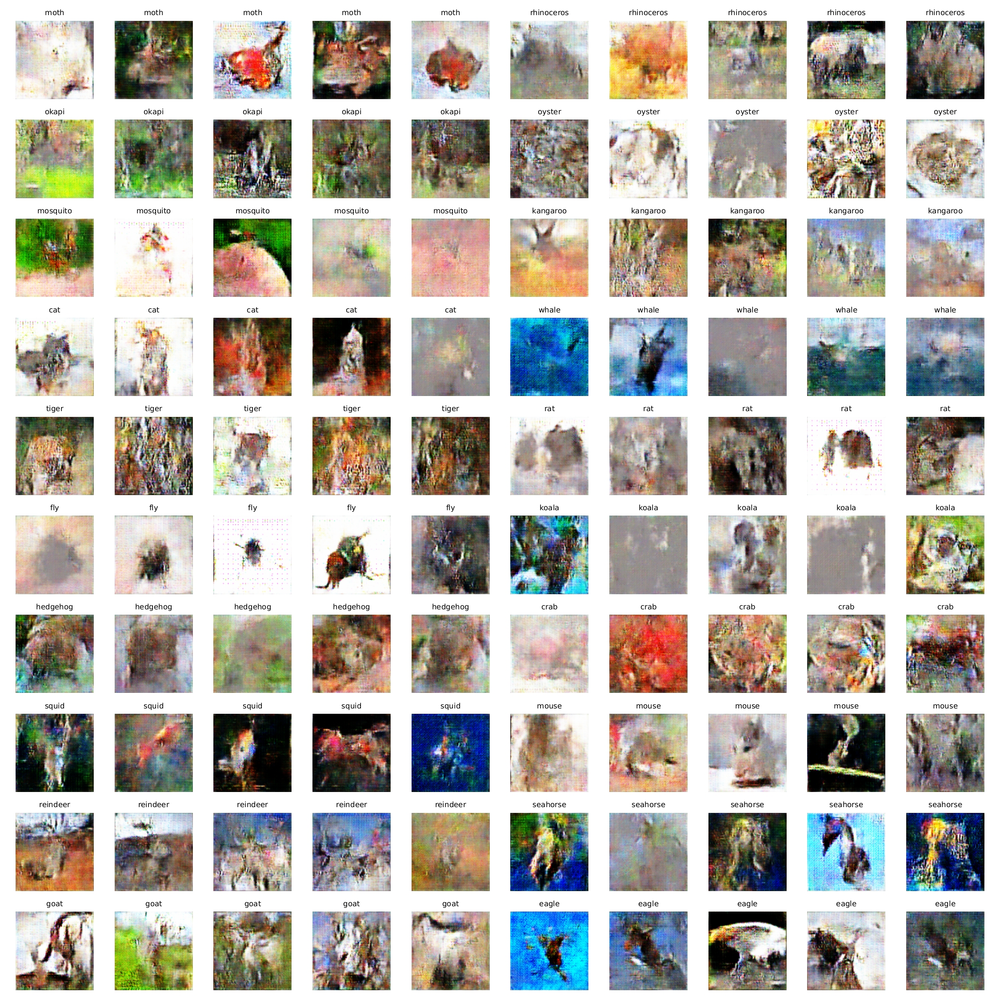

<h4> Augmentation Details </h4>

Trained Deep Convolution GAN with augmentations including:
- Increase Brightness
- Decrease Brightness
- Adjust Saturation
- Adjust Sharpness
- Random Affine
- Random Perspective
- Random Rotation
- Gaussian Blur

Total dataset Size: 20(classes) * 60(per class) * 9(augmentation) = 10,800

<h4> Observations </h4>

Above results are with Wasserstein metric. 

On training Discriminator different number of times following FID were achieved:
<ol> 
    <li> Discriminator: 3 times, Generator: 1 time -> <b>FID: 288.58</> </li>
    <li> Discriminator: 2 times, Generator: 1 time -> FID: 311.93 </li>
<ol>

## Question 7 : Comparison between WGan and Vanilla Gan 

1. **Models Trained:**
   - Both WGAN (Wasserstein GAN) and vanilla GAN were trained using Jensen-Shannon (JS) divergence loss.

2. **Mode Collapse:**
   - **JS-GAN**: Mode collapse was observed in the vanilla GAN with JS loss.
   - **WGAN**: No mode collapse was observed in the WGAN model.

3. **FID Scores:**
   - **WGAN**: FID score = **142**.
   - **JS-GAN**: FID score = **247**.

4. **Training Details:**
   - Both models were trained for **5000 epochs** with **real-time data augmentation**.

5. **Gradient Penalty:**
   - A **gradient penalty** was applied to ensure the **Critic** in WGAN satisfied the 1-Lipschitz constraint.


## Analysis

The WGAN model demonstrates superior performance both in terms of stability and quality of generated data compared to the JS-GAN. The key points can be regressed upon as follows:

1. **Mode Collapse in JS-GAN:**
   - The vanilla GAN suffered from mode collapse due to the limitations of JS divergence. When the generator distribution does not overlap significantly with the real data distribution, the JS divergence provides vanishing gradients, causing the generator to produce repetitive outputs (mode collapse).

2. **WGAN's Stability:**
   - WGAN avoids mode collapse because it leverages the **Wasserstein distance** (Earth Mover’s Distance), which provides more meaningful gradients even when the generator’s distribution is far from the real distribution. This stability is reflected in its lower FID score of 142, indicating better quality generation compared to the JS-GAN (FID = 247).

3. **Role of Gradient Penalty:**
   - In WGAN, enforcing the **1-Lipschitz continuity** constraint on the critic function (also known as the discriminator in vanilla GANs) is essential for stable training. This was achieved by applying a gradient penalty, which helps maintain the necessary Lipschitz continuity. Without this penalty, the critic might overestimate the Wasserstein distance, leading to instability in training.

4. **FID Scores Comparison:**
   - The **FID score** measures how closely the generated data matches the real data distribution. The lower FID score in WGAN (142) compared to the JS-GAN (247) further confirms that WGAN generated higher-quality data with fewer artifacts and a more diverse range of outputs.

## Question 8 : GAN with decoder with Wasserstein distance

In [ ]:
class DCGan_dec(nn.Module):
    def __init__(self, input_dims = 100, output_dims = 1):
        super(DCGan,self).__init__()
        self.gen = Generator(latent_size = latent_size)
        self.critic = Critic(output_dims = output_dims)
        self.decoder = Critic(output_dims = latent_size)


class DCTrainer_Dec(DCTrainer):
    def __init__(self,model , dataloader , augmentor, optim_gen , optim_critic  , epochs, device ,latent_dims, lambda_ = 5 , path ='multi'):
        super(DCTrainer_Dec).__init(self,model , dataloader , augmentor, optim_gen , optim_critic  , epochs, device ,latent_dims, lambda_ = 5 , path ='multi')
    
    def squared_norm_loss(self , z, z_):
        # Compute the squared difference
       return torch.nn.functional.mse_loss(z, z_)
    
    def train_step(self , epoch ) :
        
        
        for i , (data_batch , _) in enumerate(self.dataloader):
            data = self.augmentor.apply(data_batch).to(self.device)
            self.set_gradient_info(self.model.critic, True)
            self.set_gradient_info(self.model.gen , False)
            self.optim_critc.zero_grad()
            z = self.latent_sampler(data.shape[0]).to(device=self.device)
            gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1)).detach()
            gen_data = self.augmentor.apply(gen_data)
            gen_y   = self.model.critic(gen_data) 
            real_y = self.model.critic(data)
            loss_critic = gen_y.mean() - real_y.mean() + self.lambda_ * self.gradient_penalty(data , gen_data)
            loss_critic.backward()
            self.optim_critc.step()
            self.augmentor.adapt_probability(real_y.mean().item(), gen_y.mean().item())
           # used 3 for augmentation and 5 for augmentation_fresh
            if( i % 5 == 0):
                self.set_gradient_info(self.model.critic, False)
                self.set_gradient_info(self.model.gen , True)
                self.optim_gen.zero_grad()
                z = self.latent_sampler(data.shape[0]).to(device=self.device)
                gen_data = self.model.gen(z.unsqueeze(-1).unsqueeze(-1))
                z_ = self.model.decoder(gen_data)
                gen_data = self.augmentor.apply(gen_data)
                loss_gen = -torch.mean(self.model.critic(gen_data)) 
                loss_decoder = self.squared_norm_loss(z , z_)
                loss_gen.backward(retain_graph= True)
                loss_decoder.backward()
                self.optim_gen.step()
                print(f"Epoch [{epoch}], Critic Loss: {loss_critic.item():.4f}, Decoder Loss : {loss_decoder.item():.4f}, Generator Loss: {loss_gen.item():.4f}, Augmentation Probability: {augmentor.prob:.4f}")


## Hyperparameters

- **Batch Size:** 64
- **Input Dimensions:** 100
- **Epochs:** 3000
- **Image Size:** 128
- **Learning Rate:** 0.00002

In [ ]:
batch_size = 64
latent_size = 100
epochs = 3000
image_size  = 128

model = DCGan_dec(latent_size).to(device)
optim_critc = torch.optim.RMSprop(model.critic.parameters(), lr=0.0002)
optim_gen = torch.optim.RMSprop(list(model.gen.parameters()) + list(model.decoder.parameters()), lr=0.0002)

augmentor = AdaptiveAugmentation()
trainer = DCTrainer_Dec(model , dataloader , augmentor = augmentor, optim_critic=optim_critc, optim_gen=optim_gen, epochs=epochs, device=device, latent_dims=latent_size, lambda_=10, path='Question8')
# trainer.resume("./augmentation/checkpoint2710.pth" , 2710)
# trainer.train()

## Decoder Images
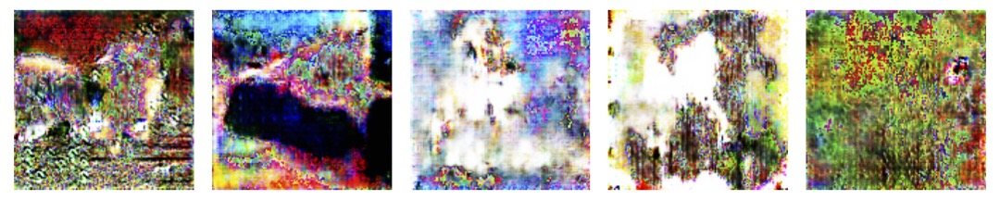



Loss plots

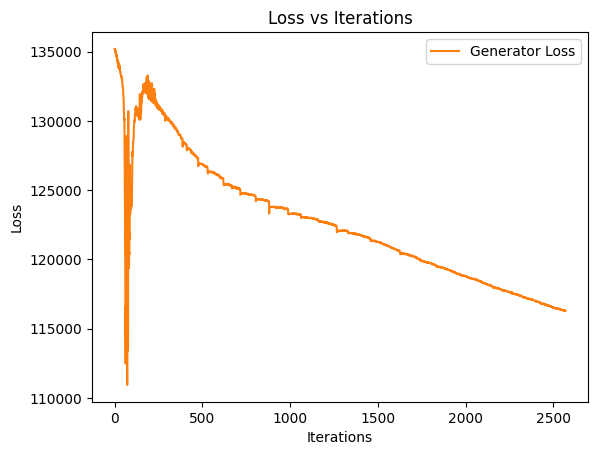
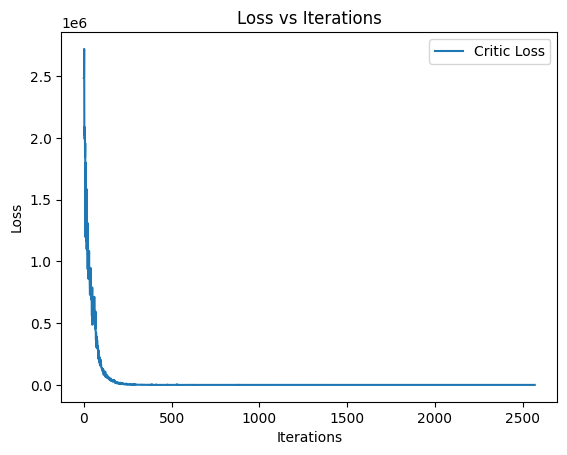
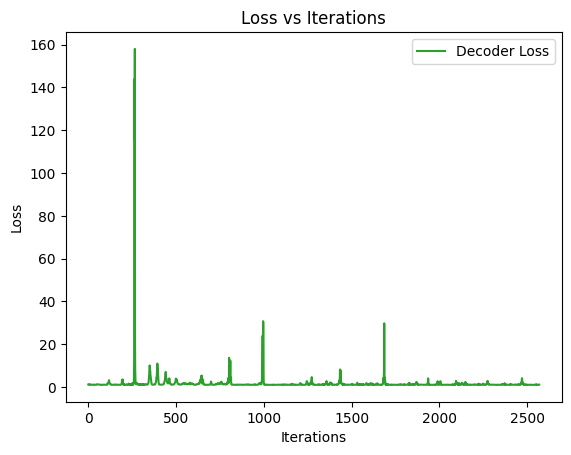

## Question 9 : MLP classification on latent from above Decoder

#### Metrics:
- **F1 Score**: 0.076 (very low)
- **Accuracy**: 23% (low but non-trivial)
- **Validation Loss**: 14 (increasing with increasing accuracy)
- **Number of Classes**: 90
- **Latent Vectors**: Obtained from a decoder trained with GAN

#### Analysis:

1. **F1 Score vs Accuracy**:
   - The low **F1 Score** (0.076) indicates the presence of **class imbalance** or **high false positives/negatives**, despite the non-trivial accuracy of 23%.
   - In multi-class classification with 90 classes, **accuracy** alone is misleading. The F1 score better captures the model’s poor performance.

2. **Validation Loss Increasing with Accuracy**:
   - **Validation loss** increasing as accuracy improves could indicate **overfitting** or the model learning to focus on certain classes while ignoring others.
   - The **GAN latent vectors** may be noisy or not well-suited for classification tasks, contributing to poor generalization.

3. **Latent Vectors from GAN Decoder**:
   - **GAN latent vectors** may not be optimally **discriminative** for the classification task. GANs typically aim to generate realistic outputs, not necessarily linearly separable features.
   - Issues like **mode collapse** in GANs could lead to **poor latent representations**, making it difficult for the classifier to learn effectively.

In [ ]:
import torch
from torch.utils.data import TensorDataset , DataLoader , random_split

import torch
import torch.nn as nn
import torch.optim as optim

class MLPClassifier(nn.Module):
    def __init__(self, input_size=100, hidden_size=128, num_classes=90):
        super(MLPClassifier, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)  
        self.relu = nn.ReLU()                         
        self.fc2 = nn.Linear(hidden_size, hidden_size)  
        self.fc3 = nn.Linear(hidden_size, num_classes) 
    
    def forward(self, x):
        out = self.fc1(x)        
        out = self.relu(out)     
        out = self.fc2(out)       
        out = self.relu(out)     
        out = self.fc3(out)       
        return out


a, b  = torch.load('deocder_dataset.pth' , map_location="cuda:1")
dataset = TensorDataset(a, b)
train , valid = random_split(dataset , (0.7 , 0.3))
train_dataloader  = DataLoader( train, batch_size=64  , shuffle= True)
val_dataloader  = DataLoader( valid, batch_size=64  , shuffle= True)
accuracies = []
val_losses = []
train_losses = []
def train(model, dataloader, optimizer, loss_fn, device):
    model.train()  
    total_loss = 0.0
    
    for batch, (inputs, targets) in enumerate(dataloader):
       
        inputs, targets = inputs.to(device), targets.to(device)
        
        
        outputs = model(inputs)
        loss = loss_fn(outputs, targets)
        
      
        optimizer.zero_grad()  
        loss.backward()       
        optimizer.step()      
        
        total_loss += loss.item() 
    
    avg_loss = total_loss / len(dataloader)
    print(f"Training Loss: {avg_loss:.4f}")
    return avg_loss

def evaluate(model, dataloader, loss_fn, device):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad(): 
        for batch, (inputs, targets) in enumerate(dataloader):
          
            inputs, targets = inputs.to(device), targets.to(device)
            
            
            outputs = model(inputs)
            loss = loss_fn(outputs, targets)
            
            total_loss += loss.item() 
            
            _, predicted = torch.max(outputs, 1)
            total += targets.size(0)
            correct += (predicted == targets).sum().item()
    
    avg_loss = total_loss / len(dataloader)
    accuracy = 100 * correct / total
    print(f"Validation Loss: {avg_loss:.4f}, Accuracy: {accuracy:.2f}%")

    
    return avg_loss, accuracy

num_epochs = 200
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
input_size = 100
num_classes = 90
model = MLPClassifier(input_size=input_size, num_classes=num_classes).to(device)

loss_fn = nn.CrossEntropyLoss() 
optimizer = optim.Adam(model.parameters(), lr=0.001)
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    train_loss = train(model, train_dataloader, optimizer, loss_fn, device)
    val_loss, val_accuracy = evaluate(model, val_dataloader, loss_fn, device)
    val_losses.append(val_loss)
    train_losses.append(train_loss)
    accuracies.append(val_accuracy)

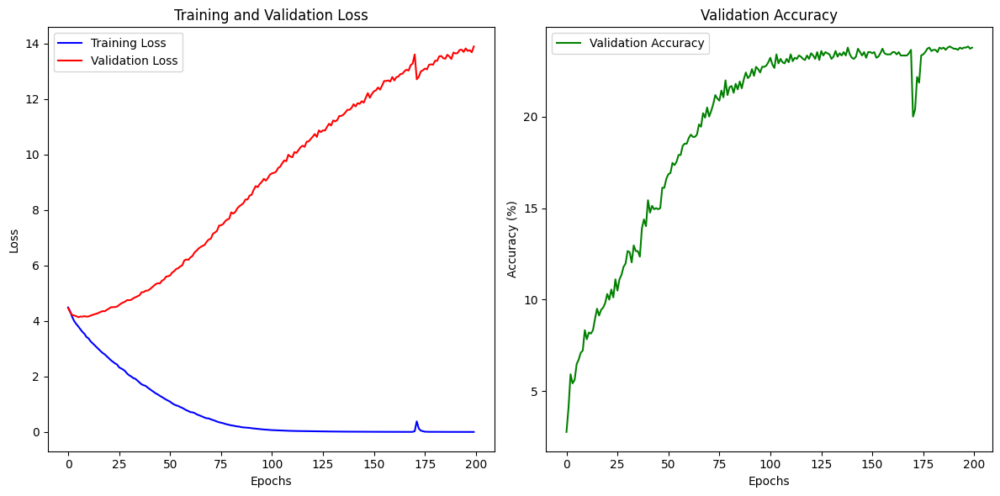

## Question 10 : Fine-Tuning Resnet-50 for classification

Preparing the dataset

In [ ]:
image_transform = transforms.Compose([transforms.Resize(255),
                                        transforms.CenterCrop(224),
                                        transforms.ToTensor(),
                                        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                                std=[0.229, 0.224, 0.225])])

batch_size = 32
train_size = int(0.8 * len(dataset))
valid_size = len(dataset) - train_size
train_dataset, valid_dataset = random_split(dataset, [train_size, valid_size])
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

In [ ]:
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
num_classes = len(dataset.classes)  
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 5 

for epoch in range(num_epochs):
    model.train() 
    running_loss = 0.0
    correct = 0
    
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()
        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        correct = torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = correct.double() / batch_size

    print(f'Epoch {epoch}/{num_epochs - 1}: Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}', end = " ")
    
    val_running_corrects = 0
    val_running_loss = 0.0
    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            val_running_loss += loss.item() * inputs.size(0)
            val_running_corrects += torch.sum(preds == labels.data)

    val_loss = val_running_loss / len(valid_loader.dataset)
    val_acc = val_running_corrects.double() / len(valid_loader.dataset)

    print(f'Val Loss: {val_loss:.4f} Val Acc: {val_acc:.4f}')

Epoch 0/4: Loss: 1.8385, Accuracy: 0.6094 Val Loss: 1.1237 Val Acc: 0.7019

Epoch 1/4: Loss: 0.6579, Accuracy: 0.7812 Val Loss: 0.9520 Val Acc: 0.7556

Epoch 2/4: Loss: 0.3494, Accuracy: 0.8125 Val Loss: 0.8494 Val Acc: 0.7796

Epoch 3/4: Loss: 0.2233, Accuracy: 0.8750 Val Loss: 0.8064 Val Acc: 0.8019

Epoch 4/4: Loss: 0.1656, Accuracy: 0.8438 Val Loss: 0.8997 Val Acc: 0.7889

In [ ]:
from sklearn.metrics import f1_score

label = []
pred = []
with torch.no_grad():
    for inputs, labels in valid_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        _, preds = torch.max(outputs, 1)
        label.append(labels.cpu())
        pred.append(preds.cpu())

l = torch.concat(label, dim = 0)
p = torch.concat(pred, dim = 0)

f1_score(l,p, average = 'micro')

micro F1-Score: 0.8167

Resnet-20 converged in about 4 epochs, we did a 90-10 split, low accuracy here can be attributed again to the small size of the dataset.

## Question 11 : Fine-Tuning Resnet-50 on 20 classes

In [ ]:
def get_random_20_classes(dataset_path='dataset/animals', 
                          sample_indices_path='20class/sampled_dataset_indices.pt', 
                          mapping_path='20class/label_mapping.pt', 
                          image_size=128):
    
    normalize = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    dataset = datasets.ImageFolder(root=dataset_path, transform=normalize)
    if os.path.exists(sample_indices_path) and os.path.exists(mapping_path):
        sampled_indices = torch.load(sample_indices_path)
        original_to_new_label_mapping = torch.load(mapping_path)
        sampled_dataset = Subset(dataset, sampled_indices)
        for index in sampled_indices:
            original_label = dataset.samples[index][1]
            new_label = original_to_new_label_mapping[original_label]
            dataset.samples[index] = (dataset.samples[index][0], new_label)
    else:
        all_classes = torch.unique(torch.tensor([label for _, label in dataset.samples]))
        sampled_classes = random.sample(list(all_classes), 20)
        print(sampled_classes)
        sampled_indices = [i for i, (_, label) in enumerate(dataset.samples) if label in sampled_classes]

        original_to_new_label_mapping = {original_label.item(): new_label for new_label, original_label in enumerate(sampled_classes)}
        torch.save(sampled_indices, sample_indices_path)
        torch.save(original_to_new_label_mapping, mapping_path)

        sampled_dataset = Subset(dataset, sampled_indices)

        for index in sampled_indices:
            _, label = dataset.samples[index]
            new_label = original_to_new_label_mapping[label]
            dataset.samples[index] = (dataset.samples[index][0], new_label)

    return sampled_dataset

dataset_20_classes = get_random_20_classes()
batch_size = 32
train_size = int(0.8 * len(dataset_20_classes))
valid_size = len(dataset_20_classes) - train_size
train_dataset, valid_dataset = random_split(dataset_20_classes, [train_size, valid_size])
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

In [ ]:
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
num_classes = 20 
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)
model = model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 5 

for epoch in range(num_epochs):
    model.train() 
    running_loss = 0.0
    correct = 0
    
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()
        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        correct = torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = correct.double() / batch_size

    print(f'Epoch {epoch}/{num_epochs - 1}: Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}', end = " ")
    
    val_running_corrects = 0
    val_running_loss = 0.0
    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            val_running_loss += loss.item() * inputs.size(0)
            val_running_corrects += torch.sum(preds == labels.data)

    val_loss = val_running_loss / len(valid_loader.dataset)
    val_acc = val_running_corrects.double() / len(valid_loader.dataset)

    print(f'Val Loss: {val_loss:.4f} Val Acc: {val_acc:.4f}')

Epoch 0/4: Loss: 1.2286, Accuracy: 0.8571 Val Loss: 0.4811 Val Acc: 0.8500

Epoch 1/4: Loss: 0.3164, Accuracy: 0.9286 Val Loss: 0.5268 Val Acc: 0.8333

Epoch 2/4: Loss: 0.2498, Accuracy: 0.8929 Val Loss: 0.3409 Val Acc: 0.9000

Epoch 3/4: Loss: 0.1723, Accuracy: 0.9821 Val Loss: 0.6176 Val Acc: 0.8167

Epoch 4/4: Loss: 0.1090, Accuracy: 0.8929 Val Loss: 0.4401 Val Acc: 0.9167

It performed well on 20 subclasses, but still due to only 60 examples it is giving better training accuracy than validation accuracy.

Micro F1-score : 0.875

## Question 12 : Augment dataset of 20 classes with c-Gan

In [ ]:
class_to_idx = {
    'moth': 0,
    'rhinoceros': 1,
    'okapi': 2,
    'oyster': 3,
    'mosquito': 4,
    'kangaroo': 5,
    'cat': 6,
    'whale': 7,
    'tiger': 8,
    'rat': 9,
    'fly': 10,
    'koala': 11,
    'hedgehog': 12,
    'crab': 13,
    'squid': 14,
    'mouse': 15,
    'reindeer': 16,
    'seahorse': 17,
    'goat': 18,
    'eagle': 19
}

map1 = {
    0: 6,
    1: 13,
    2: 19,
    3: 10,
    4: 18,
    5: 12,
    6: 5,
    7: 11,
    8: 4,
    9: 0,
    10: 15,
    11: 2,
    12: 3,
    13: 9,
    14: 16,
    15: 1,
    16: 17,
    17: 14,
    18: 8,
    19: 7
}

def target_transform(target):
    return map1[target]

# Define any transformations for the images (e.g., resizing, normalization)
normalize = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

dataset = get_random_20_classes()
dataset2 = datasets.ImageFolder(root='../generated_images_5', transform=normalize, target_transform=target_transform)
new_dataset = torch.utils.data.ConcatDataset([dataset, dataset2])

train_size = int(0.9 * len(new_dataset))
valid_size = len(new_dataset) - train_size
batch_size = 128
train_dataset, valid_dataset = random_split(new_dataset, [train_size, valid_size])
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
num_classes = 20
device = 'cuda:2'
in_features = model.fc.in_features
model.fc = torch.nn.Linear(in_features, num_classes)
model = model.to(device)
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 5 

for epoch in range(num_epochs):
    model.train() 
    running_loss = 0.0
    correct = 0
    
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()
        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        correct += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_loader.dataset)
    last_acc = correct.double() / len(train_loader.dataset)

    print(f'Epoch {epoch}/{num_epochs - 1}: Loss: {epoch_loss:.4f}, Accuracy: {last_acc:.4f}', end = " ")
    
    val_running_corrects = 0
    val_running_loss = 0.0
    with torch.no_grad():
        for inputs, labels in valid_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            _, preds = torch.max(outputs, 1)

            val_running_loss += loss.item() * inputs.size(0)
            val_running_corrects += torch.sum(preds == labels.data)

    val_loss = val_running_loss / len(valid_loader.dataset)
    val_acc = val_running_corrects.double() / len(valid_loader.dataset)

    print(f'Val Loss: {val_loss:.4f} Val Acc: {val_acc:.4f}')

Epoch 0/4: Loss: 2.3070, Accuracy: 0.3108 Val Loss: 1.8467 Val Acc: 0.4563

Epoch 1/4: Loss: 1.5166, Accuracy: 0.5493 Val Loss: 1.3773 Val Acc: 0.5969

Epoch 2/4: Loss: 0.7453, Accuracy: 0.7854 Val Loss: 1.2549 Val Acc: 0.6375

Epoch 3/4: Loss: 0.3074, Accuracy: 0.9083 Val Loss: 1.2604 Val Acc: 0.6531

Epoch 4/4: Loss: 0.1497, Accuracy: 0.9556 Val Loss: 1.1266 Val Acc: 0.6750

Micro F1-score: 0.675

As CGAN didn't generate good images, reduction in accuracy can be attributed to that.